# Combined Jupyter Notebook

# Data preparation for Spotify data

Spotify is a digital music service that gives you access to millions of songs, and in 2021 has amassed 406 million active users, with 180 million premium subscribers.

Many would probably be familiar with the [Spotify](https://spotifycharts.com/regional) and [Billboard](https://www.billboard.com/charts/) Charts. These lists are constantly evolving, and songs are added and taken off every day. 

[Spotify's API](https://developer.spotify.com/documentation/web-api/reference/#/operations/get-several-audio-features) also provides features for every song, with their integration of the echonest API

We want to find out if audio features can be used to predict a hit song, and if so, which models work best.

### Libraries used in data preparation

In [1]:
import pandas as pd
import numpy as np

pd.options.mode.chained_assignment = None # Pretty sure this will come back to stab me in the back

githubrepo = 'https://raw.githubusercontent.com/joedav98/SC1015_SC18_SpotifyRepo/main/data/'
# Data is uploaded to a github repo, in order to pull when we need

### Collection of functions for dataprep

In [2]:
def converttonumeric(final):
    final.danceability = pd.to_numeric(final.danceability)
    final.energy = pd.to_numeric(final.energy)
    final.loudness = pd.to_numeric(final.loudness)
    final.speechiness = pd.to_numeric(final.speechiness)
    final.acousticness = pd.to_numeric(final.acousticness)
    final.liveness = pd.to_numeric(final.liveness)
    final.valence = pd.to_numeric(final.valence)
    final.tempo = pd.to_numeric(final.tempo)
    final.duration_ms = pd.to_numeric(final.duration_ms)
    final.year = pd.to_numeric(final.year)
# Function to convert all values to numeric

def convertKeytoCat(df):
    df['key'] = df['key'].replace({
      0 : 'C', 
      1 : 'C#/Db', 
      2 : 'D', 
      3 : 'D#/Eb', 
      4 : 'E', 
      5 : 'F', 
      6 : 'F#/Gb', 
      7 : 'G', 
      8 : 'G#/Ab', 
      9 : 'A', 
      10 : 'A#/Bb', 
      11 : 'B'})
# Convert key from numbers to letters
  
def convertKeytoNum(df):
    drop20s['key'] = drop20s['key'].str[0].map({
      'C' : 0, 
      'C#/Db' : 1, 
      'D' : 2, 
      'D#/Eb' : 3, 
      'E' : 4, 
      'F' : 5, 
      'F#/Gb' : 6, 
      'G' : 7, 
      'G#/Ab' : 8, 
      'A' : 9, 
      'A#/Bb' : 10, 
      'B' : 11})
# Encode key

## NonHit songs dataset

Taken from https://www.kaggle.com/datasets/luckey01/test-data-set

The original CSV files had to be split into separate files to upload to GitHub, so they are being recombined in the top of the code. Each decade had their own number of hit songs, thus an equal amount for each decade was sampled from the nonhits. Decade10 encountered some problems as there was a heavy skew towards the later years, thus they were manually sampled.

In [3]:
nonhit0 = pd.read_csv(githubrepo + 'spotify_tracks_metadata_0.csv')
nonhit1 = pd.read_csv(githubrepo + 'spotify_tracks_metadata_1.csv')
nonhit2 = pd.read_csv(githubrepo + 'spotify_tracks_metadata_2.csv')
nonhit3 = pd.read_csv(githubrepo + 'spotify_tracks_metadata_3.csv')
nonhit4 = pd.read_csv(githubrepo + 'spotify_tracks_metadata_4.csv')
nonhit5 = pd.read_csv(githubrepo + 'spotify_tracks_metadata_5.csv')
nonhit6 = pd.read_csv(githubrepo + 'spotify_tracks_metadata_6.csv')


nonhit1 = pd.DataFrame(data = nonhit1.values, columns = nonhit0.columns)
nonhit2 = pd.DataFrame(data = nonhit2.values, columns = nonhit0.columns)
nonhit3 = pd.DataFrame(data = nonhit3.values, columns = nonhit0.columns)
nonhit4 = pd.DataFrame(data = nonhit4.values, columns = nonhit0.columns)
nonhit5 = pd.DataFrame(data = nonhit5.values, columns = nonhit0.columns)
nonhit6 = pd.DataFrame(data = nonhit6.values, columns = nonhit0.columns)


nonhitmerge = pd.concat([nonhit0, nonhit1, nonhit2, nonhit3, nonhit4, nonhit5, nonhit6], ignore_index = True).sort_values(by = ['album_release_year'])

nonhitpre = nonhitmerge.drop(labels = ['Unnamed: 0',
                                        'spotify_id',
                                        'album_release_date',
                                        'album_release_month',
                                        'analysis_url',
                                        'mode',
                                        'song_explicit',
                                        'time_signature',
                                        'total_available_markets',
                                        'track_href',
                                        'uri',
                                        'instrumentalness'],
                      axis = 1,
                      inplace = False)

nonhitpre.rename(columns = {'song_name':'track',
                            'artist_name':'artist',
                            'album_release_year':'year'},
               inplace = True) # Renaming columns to merge with larger dataset

nonhitprocess = nonhitpre[nonhitpre.song_popularity <= 50].dropna() # Using popularity feature to avoid hit songs
nonhitprocess = nonhitprocess.drop(labels = ['song_popularity'], axis = 1, inplace = False)

decade90nonhitpre = nonhitprocess[(nonhitprocess.year >= 1990) & (nonhitprocess.year <= 1999)].sort_values(by = ['year'])
decade00nonhitpre = nonhitprocess[(nonhitprocess.year >= 2000) & (nonhitprocess.year <= 2009)].sort_values(by = ['year'])
decade10nonhitpre1 = nonhitprocess[(nonhitprocess.year >= 2010) & (nonhitprocess.year <= 2018)].sort_values(by = ['year'])
decade10nonhitpre2 = nonhitprocess[(nonhitprocess.year == 2019)].sort_values(by = ['year'])
decade10nonhitpre3 = nonhitprocess[(nonhitprocess.year == 2020)].sort_values(by = ['year'])
decade10nonhitpre4 = nonhitprocess[(nonhitprocess.year == 2021)].sort_values(by = ['year'])

decade90nonhit = decade90nonhitpre.sample(n = 2700, random_state = 52)
decade00nonhit = decade00nonhitpre.sample(n = 2830, random_state = 52)
decade10nonhit1 = decade10nonhitpre1.sample(n = 2570, random_state = 52)
decade10nonhit2 = decade10nonhitpre2.sample(n = 480, random_state = 52)
decade10nonhit3 = decade10nonhitpre3.sample(n = 450, random_state = 52)
decade10nonhit4 = decade10nonhitpre4.sample(n = 500, random_state = 52)

decade10nonhit = pd.concat([decade10nonhit1, decade10nonhit2, decade10nonhit3, decade10nonhit4], join = 'inner')

for nonhit in [decade90nonhit, decade00nonhit, decade10nonhit]:
    nonhit['charted'] = False
    nonhit['weeks-on-board'] = 0
    converttonumeric(nonhit)
    convertKeytoCat(nonhit)

In [4]:
print(f"Decade 90 NonHits: {len(decade90nonhit.index)}")
print(f"Decade 00 NonHits: {len(decade00nonhit.index)}")
print(f"Decade 10 NonHits: {len(decade10nonhit.index)}")

Decade 90 NonHits: 2700
Decade 00 NonHits: 2830
Decade 10 NonHits: 4000


## Hit songs from 2020 and 2021
Taken from https://www.kaggle.com/datasets/sashankpillai/spotify-top-200-charts-20202021

The original hit songs dataset that we acquired lacked data from 2020 to 2021, thus we had to find a separate dataset to fill in the gap.

In [5]:
data20s = pd.read_csv(githubrepo + 'dataset-of-20s.csv')
data20s = data20s[data20s['Highest Charting Position'] <= 100] # Getting only top 100, instead of top 200
drop20s = data20s.drop(labels = ['Index',
                                 'Highest Charting Position',
                                 'Week of Highest Charting',
                                 'Streams',
                                 'Artist Followers',
                                 'Song ID',
                                 'Genre',
                                 'Popularity',
                                 'Release Date'],
                       axis = 1,
                       inplace = False) # Dataset of hit songs from 2019 to 2021

drop20s['Weeks Charted'] = drop20s['Weeks Charted'].str[:4] # Extracting year of charting from weeks charted

drop20s.rename(columns = {'Number of Times Charted':'weeks-on-board',
                          'Song Name':'track',
                          'Artist':'artist',
                          'Weeks Charted':'year',
                          'Danceability':'danceability',
                          'Energy':'energy',
                          'Loudness':'loudness',
                          'Speechiness':'speechiness',
                          'Acousticness':'acousticness',
                          'Liveness':'liveness',
                          'Tempo':'tempo',
                          'Duration (ms)':'duration_ms',
                          'Valence':'valence',
                          'Chord':'key'},
               inplace = True) # Renaming columns to merge with larger dataset

drop20s = drop20s.replace(r'^\s*$', np.nan, regex=True)
drop20s.dropna(subset=['danceability'], inplace=True)


## Hit songs dataset
Taken from 

https://www.kaggle.com/datasets/theoverman/the-spotify-hit-predictor-dataset

https://www.kaggle.com/datasets/dhruvildave/spotify-charts

First dataset was used to get the song features necessary for our analysis. Only data from 1990 to 2021 was extracted. The second dataset contained our billboard charts data, which included the number of weeks a song has been on the billboard charts. We used this to convert to a boolean feature that simply states whether or not a song is a hit.
    


In [6]:
data90s = pd.read_csv(githubrepo + 'dataset-of-90s.csv')
data00s = pd.read_csv(githubrepo + 'dataset-of-00s.csv')
data10s = pd.read_csv(githubrepo + 'dataset-of-10s.csv')
charts = pd.read_csv(githubrepo + 'charts.csv').drop_duplicates(subset=['song', 'artist'], keep = 'first') 
# Dataset from Billboard, drop duplicates leaves only the latest occurence of a hit song

datayears = [data90s, data00s, data10s] # Dataset of top tracks from 1960s to 2010s, with Echonest info
reference = pd.concat(datayears, ignore_index = True).drop_duplicates(subset = ['track', 'artist'], keep = 'last') # Leaves only latest occurence of a hit song
charts['date'] = charts['date'].str[:-6]

dropref = reference.drop(labels = ['uri', 
                                   'mode',
                                   'chorus_hit',
                                   'sections',
                                   'target',
                                   'instrumentalness',
                                   'time_signature'], 
                        axis = 1, 
                        inplace = False) # Dropping features that won't be helpful in analysis

dropcharts = charts.drop(labels = ['rank', 
                                   'last-week',
                                   'peak-rank'],
                         axis = 1,
                         inplace = False).reset_index(drop = True) # Dropping features that won't be helpful in analysis
# Rank and peak rank can change in a single year, last week is redundant as we are using the year it charted

mergedDF = pd.merge(dropref, dropcharts, left_on = ['track', 'artist'], right_on = ['song', 'artist']) # Merging Spotify data with Billboard data

mergedDF = mergedDF.drop(labels = ['song'], axis = 1, inplace = False)
mergedDF.rename(columns = {'date':'year'}, inplace = True)

mergedDF.year = pd.to_numeric(mergedDF.year)

decade90hit = mergedDF[(mergedDF.year >= 1990) & (mergedDF.year <= 1999)]
decade00hit = mergedDF[(mergedDF.year >= 2000) & (mergedDF.year <= 2009)]
decade10hit = mergedDF[(mergedDF.year >= 2010) & (mergedDF.year <= 2021)]

decade10hit = pd.concat([decade10hit, drop20s], join = 'outer').drop_duplicates(subset = ['track', 'artist'], keep = 'last') # Joining the merged dataset with the dataset from 2019 to 2021, defaulting to merged dataset for clashes

hits = [decade90hit, decade00hit, decade10hit]
for hit in hits:
    hit['charted'] = True
    converttonumeric(hit)
    convertKeytoCat(hit)

In [7]:
print(f"Decade 90 Hits: {len(decade90hit.index)}")
print(f"Decade 00 Hits: {len(decade00hit.index)}")
print(f"Decade 10 Hits: {len(decade10hit.index)}")

Decade 90 Hits: 2673
Decade 00 Hits: 2831
Decade 10 Hits: 4065


In [8]:
decade90 = pd.concat([decade90hit, decade90nonhit], join = 'inner').reset_index(drop = True)
decade00 = pd.concat([decade00hit, decade00nonhit], join = 'inner').reset_index(drop = True)
decade10 = pd.concat([decade10hit, decade10nonhit], join = 'inner').reset_index(drop = True)

decadeHits = pd.concat([decade90hit,decade00hit,decade10hit], join = 'inner').reset_index(drop = True)
decadeNonHits = pd.concat([decade90nonhit,decade00nonhit,decade10nonhit], join = 'inner').reset_index(drop = True)

# Sorting by year then by weeks-on-board, resetting index as a final preparation of the dataset
decade90 = decade90.sort_values(by = ['year', 'weeks-on-board']).reset_index(drop = True)
decade00 = decade00.sort_values(by = ['year', 'weeks-on-board']).reset_index(drop = True)
decade10 = decade10.sort_values(by = ['year', 'weeks-on-board']).reset_index(drop = True)

In [9]:
from sklearn import preprocessing

scaler = preprocessing.MinMaxScaler()

prep = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'liveness', 'valence', 'tempo', 'duration_ms']

# Normalising values with MinMaxScaler()

for decade in [decade90, decade00, decade10]:
    decade[prep] = scaler.fit_transform(decade[prep])

In [10]:
column_names = ['track', 
                'artist', 
                'key', 
                'danceability', 
                'energy', 
                'loudness', 
                'speechiness', 
                'acousticness', 
                'liveness', 
                'valence', 
                'tempo', 
                'duration_ms', 
                'year', 
                'weeks-on-board', 
                'charted'] 

decade90 = decade90.reindex(columns = column_names)
decade00 = decade00.reindex(columns = column_names)
decade10 = decade10.reindex(columns = column_names)

## Output main decades to CSV

In [11]:
decade90nonhit.to_csv('output/eda/decade90nonhit.csv', index = False)
decade00nonhit.to_csv('output/eda/decade00nonhit.csv', index = False)
decade10nonhit.to_csv('output/eda/decade10nonhit.csv', index = False)

decade90hit.to_csv('output/eda/decade90hit.csv', index = False)
decade00hit.to_csv('output/eda/decade00hit.csv', index = False)
decade10hit.to_csv('output/eda/decade10hit.csv', index = False)

decade90.to_csv('output/decade90.csv', index = False)
decade00.to_csv('output/decade00.csv', index = False)
decade10.to_csv('output/decade10.csv', index = False)

## Train Test Split

In [12]:
from sklearn.model_selection import train_test_split

train90, test90 = train_test_split(decade90, test_size = 0.2, random_state = 52)
train00, test00 = train_test_split(decade00, test_size = 0.2, random_state = 52)
train10, test10 = train_test_split(decade10, test_size = 0.2, random_state = 52)

train90.head()

,track,artist,key,danceability,energy,loudness,speechiness,acousticness,liveness,valence,tempo,duration_ms,year,weeks-on-board,charted
3861,If U Stay Ready,Suga Free,E,0.716037,0.687766,0.884529,0.219107,0.019478,0.038477,0.448589,0.448757,0.202938,1997.0,13,True
1109,Money Don't Matter 2 Night,Prince And The N.P.G.,C#/Db,0.841675,0.568677,0.786922,0.036137,0.029217,0.059619,0.708669,0.505929,0.202648,1992.0,13,True
2344,Ugly in the Morning,Faith No More,E,0.396323,0.977983,0.823127,0.077882,0.002098,0.235471,0.323589,0.502235,0.130339,1995.0,0,False
4279,เมื่อรักฉันเกิด,Silly Fools,C#/Db,0.583248,0.714786,0.752122,0.043821,0.023695,0.158317,0.744960,0.422700,0.204099,1998.0,0,False
1638,I Got A Thang 4 Ya!,Lo-Key?,F#/Gb,0.772217,0.649737,0.836118,0.047456,0.308233,0.060721,0.794355,0.607662,0.241999,1993.0,20,True


## Output Train and Test datasets to CSVs

To be used with spotify_machine_learning.ipynb

In [13]:
train90.to_csv('output/train/train90.csv', index = False)
train00.to_csv('output/train/train00.csv', index = False)
train10.to_csv('output/train/train10.csv', index = False)

test90.to_csv('output/test/test90.csv', index = False)
test00.to_csv('output/test/test00.csv', index = False)
test10.to_csv('output/test/test10.csv', index = False)

# Exploratory Data Analysis of Spotify data 

We want to explore the trends of hit songs over the decades, by doing these, we can figure out whether or not we need to make changes to our preparation. We also want to see if there are any correlation between features that would tell us something more.

### Libraries needed for EDA

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np
import plotly.graph_objects as go

%config InlineBackend.figure_format = 'retina' # Higher quality images for slides

githubrepo = 'https://raw.githubusercontent.com/joedav98/SC1015_SC18_SpotifyRepo/main/data/'

### Files needed for EDA, taken from Data Prep stage

In [36]:
decade90 = pd.read_csv('output/decade90.csv')
decade00 = pd.read_csv('output/decade00.csv')
decade10 = pd.read_csv('output/decade10.csv')

decade90nonhit = pd.read_csv('output/eda/decade90nonhit.csv')
decade00nonhit = pd.read_csv('output/eda/decade00nonhit.csv')
decade10nonhit = pd.read_csv('output/eda/decade10nonhit.csv')

decade90hit = pd.read_csv('output/eda/decade90hit.csv')
decade00hit = pd.read_csv('output/eda/decade00hit.csv')
decade10hit = pd.read_csv('output/eda/decade10hit.csv')

### Examining the number of songs per year, taken from our sampled data
We want to explore the number in order to see if there are any imbalances. Initially, Decade10 had a huge imbalance towards 2020 and 2021, thus we resampled those years manually to ensure a better spread.

Decade 90s: 5373
Decade 00s: 5661
Decade 10s: 8065


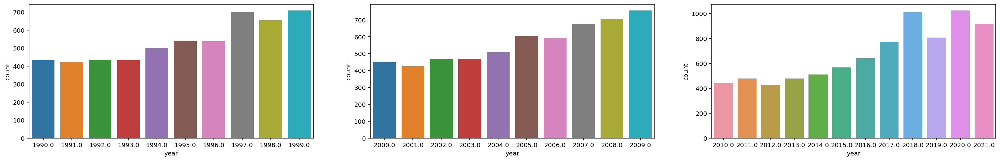

In [37]:
print(f"Decade 90s: {len(decade90.index)}")
print(f"Decade 00s: {len(decade00.index)}")
print(f"Decade 10s: {len(decade10.index)}")


f, axes = plt.subplots(1, 3, figsize=(28, 4))
ax = sb.countplot(x = 'year', data = decade90, ax = axes[0])
ax = sb.countplot(x = 'year', data = decade00, ax = axes[1])
ax = sb.countplot(x = 'year', data = decade10, ax = axes[2])

### Making the NonHit and Hit DataFrames

In [41]:
decadeHits = pd.concat([decade90hit, decade00hit, decade10hit], join = 'inner').reset_index(drop = True)
decadeNonHits = pd.concat([decade90nonhit, decade00nonhit, decade10nonhit], join = 'inner').reset_index(drop = True)


final = pd.concat([decade90, decade00, decade10], join = 'inner').reset_index(drop = True)

display(final)

,track,artist,danceability,energy,key,loudness,speechiness,acousticness,liveness,valence,tempo,duration_ms,year,weeks-on-board,charted
0,Dodji sto pre,Vesna Zmijanac,0.670,0.4230,E,-16.205,0.0513,0.3610,0.1220,0.8490,137.827,180881.0,1990.0,0,False
1,改變所有的錯,Harlem Yu,0.433,0.5490,A,-7.074,0.0279,0.5800,0.1530,0.2980,145.520,275120.0,1990.0,0,False
2,Being Boring - 2001 Remaster,Pet Shop Boys,0.634,0.7990,G#/Ab,-9.541,0.0398,0.0689,0.3130,0.2700,119.776,410173.0,1990.0,0,False
3,"E Draga, Draga",Zdravko Colic,0.865,0.2810,C,-15.618,0.0381,0.3240,0.0472,0.6290,104.555,273311.0,1990.0,0,False
4,Handel : Concerto grosso in F major Op.3 No.4a...,George Frideric Handel,0.356,0.0828,E,-19.069,0.0372,0.9730,0.1070,0.3750,104.302,131480.0,1990.0,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19094,Lucid Dreams,Juice WRLD,0.511,0.5660,F#/Gb,-7.230,0.2000,0.3490,0.3400,0.2180,83.903,239836.0,2021.0,83,True
19095,bad guy,Billie Eilish,0.701,0.4250,G,-10.965,0.3750,0.3280,0.1000,0.5620,135.128,194088.0,2021.0,83,True
19096,Adore You,Harry Styles,0.676,0.7710,G#/Ab,-3.675,0.0483,0.0237,0.1020,0.5690,99.048,207133.0,2021.0,83,True
19097,Circles,Post Malone,0.695,0.7620,C,-3.497,0.0395,0.1920,0.0863,0.5530,120.042,215280.0,2021.0,84,True


### Number of songs by each artist, found on the billboard charts

In [72]:
decadeHits.artist.value_counts().head(20)

Taylor Swift     89
Drake            69
Glee Cast        52
Justin Bieber    44
Tim McGraw       43
Kenny Chesney    42
Eminem           41
The Weeknd       38
Ariana Grande    36
Keith Urban      35
Madonna          34
George Strait    34
Toby Keith       34
Rascal Flatts    33
Brad Paisley     32
Lady Gaga        31
Mariah Carey     30
Jason Aldean     29
Juice WRLD       29
Blake Shelton    29
Name: artist, dtype: int64

## Box-plot of the weeks-on-board feature
Some songs had been on the billboard charts for years, making far outliers and skewed data. For this reason, we decided to skip linear regression and instead focus on classification.

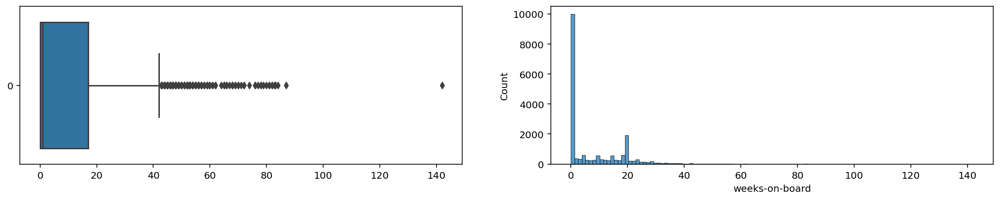

In [43]:
f, axes = plt.subplots(1, 2, figsize=(18, 3))
sb.boxplot(data = final['weeks-on-board'], orient = "h", ax = axes[0])
sb.histplot(data = final['weeks-on-board'], ax = axes[1])
plt.show()

## Number of songs in different keys throughout the decades

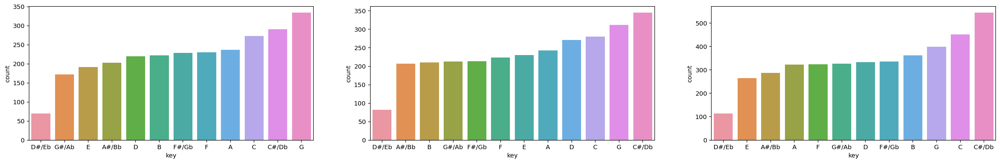

In [44]:
f, axes = plt.subplots(1, 3, figsize=(28, 4))
ax = sb.countplot(x = 'key', data = decade90hit, order = decade90hit['key'].value_counts(ascending = True).index, ax = axes[0])
ax = sb.countplot(x = 'key', data = decade00hit, order = decade00hit['key'].value_counts(ascending = True).index, ax = axes[1])
ax = sb.countplot(x = 'key', data = decade10hit, order = decade10hit['key'].value_counts(ascending = True).index, ax = axes[2])
plt.show()

## Duration of songs
Represented in both minutes and milliseconds

In [51]:
decadeHits['duration_min'] = decadeHits['duration_ms']/60000
grouped_music = decadeHits['duration_min'].groupby(decadeHits['year']).describe()

year_avg_time = grouped_music['mean']
year_avg_min = grouped_music['mean'] - grouped_music['std']
year_avg_max = grouped_music['mean'] + grouped_music['std']

grouped_music.tail()

,count,mean,std,min,25%,50%,75%,max
year,,,,,,,,
2017,317.0,3.626292,0.669251,1.794550,3.240217,3.571083,3.935783,7.676217
2018,373.0,3.469952,0.752197,1.230217,3.044450,3.478883,3.842000,6.965333
2019,326.0,3.334562,0.613781,1.605550,2.972775,3.303225,3.691438,6.021333
2020,573.0,3.312476,0.729850,0.502217,2.863300,3.265100,3.667383,7.626533
2021,415.0,3.316812,0.827900,0.969150,2.800967,3.243683,3.648750,9.802317


### Average duration of music in minutes

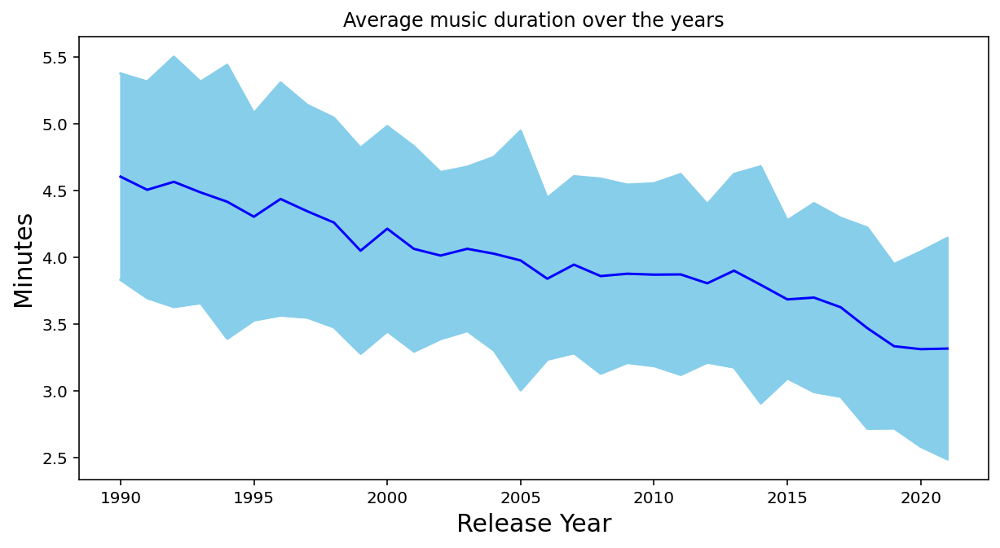

In [52]:
fig, x= plt.subplots(figsize=(10,5))
x.plot(year_avg_time,color = "blue")
x.plot(year_avg_min,color = "skyblue")
x.plot(year_avg_max,color = "skyblue")
x.fill_between(grouped_music.index, year_avg_min, year_avg_max, color = "skyblue")
x.set_title('Average music duration over the years')
x.set_xlabel('Release Year',fontsize = 15)
x.set_ylabel('Minutes',fontsize = 15)
plt.show()

### Average duration of music in milliseconds

Text(0.5, 0, 'Year')

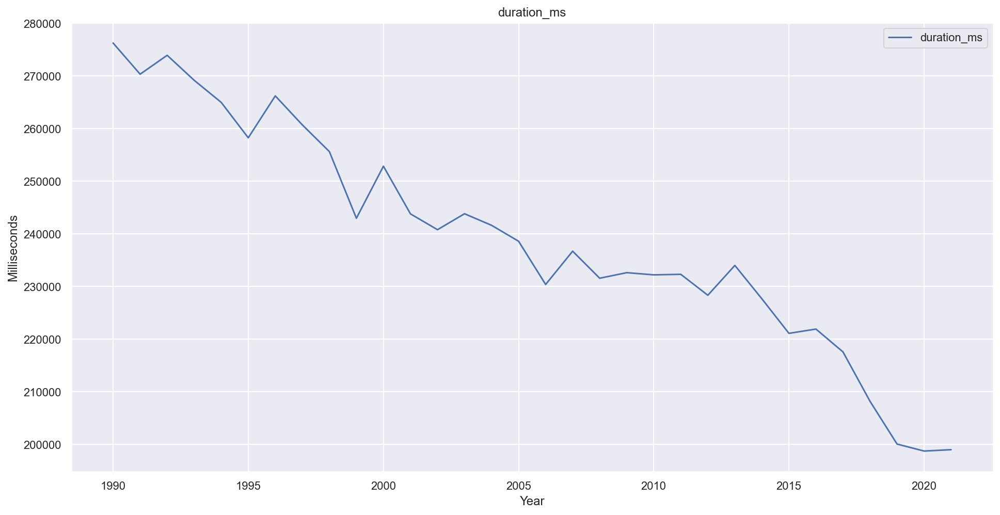

In [63]:
plt.figure(figsize = (16,8))
sb.set(style="darkgrid")
x=decadeHits.groupby('year')['duration_ms'].mean()
ax=sb.lineplot(x=x.index,y=x,label='duration_ms')
ax.set_title('duration_ms')
ax.set_ylabel('Milliseconds')
ax.set_xlabel('Year')

## Danceability of songs over the years
Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.

Text(0.5, 0, 'Year')

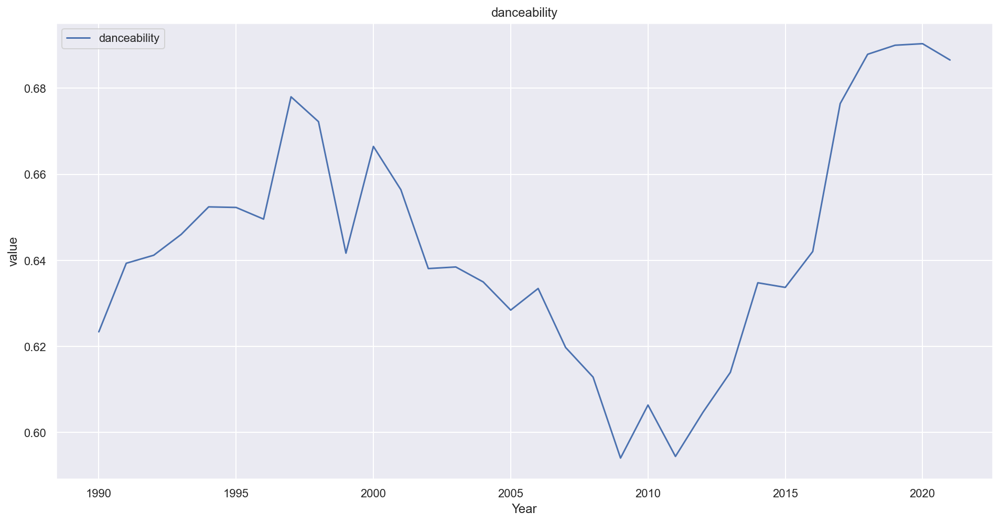

In [64]:
plt.figure(figsize = (16,8))
sb.set(style="darkgrid")
x=decadeHits.groupby('year')['danceability'].mean()
ax=sb.lineplot(x=x.index,y=x,label='danceability')
ax.set_title('danceability')
ax.set_ylabel('value')
ax.set_xlabel('Year')

## Tempo of songs over the years
The overall estimated tempo of a track in beats per minute (BPM).

Text(0.5, 0, 'Year')

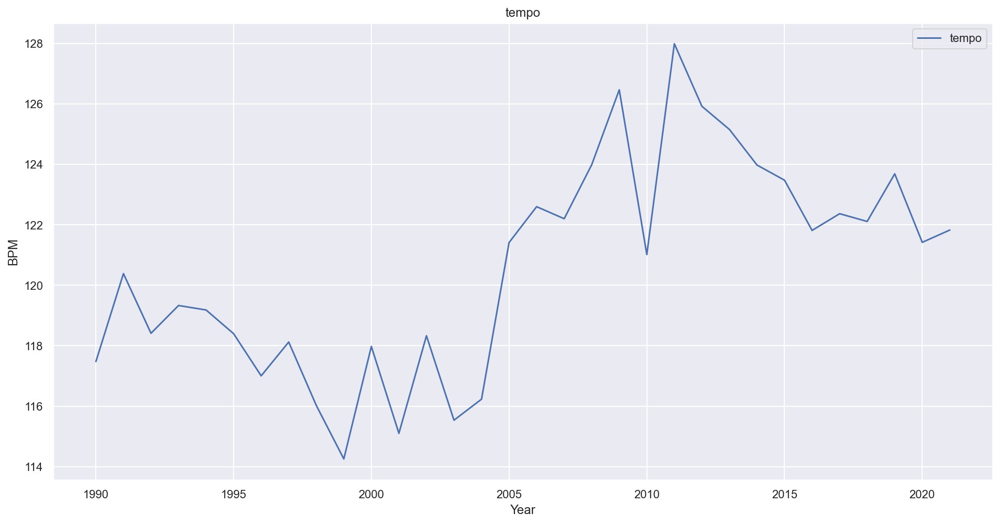

In [65]:
plt.figure(figsize = (16,8))
sb.set(style="darkgrid")
x=decadeHits.groupby('year')['tempo'].mean()
ax=sb.lineplot(x=x.index,y=x,label='tempo')
ax.set_title('tempo')
ax.set_ylabel('BPM')
ax.set_xlabel('Year')

## Loudness of songs over the years
The overall average loudness of a track in decibels (dB). Values typically range between -60 and 0 db.

Text(0.5, 0, 'Year')

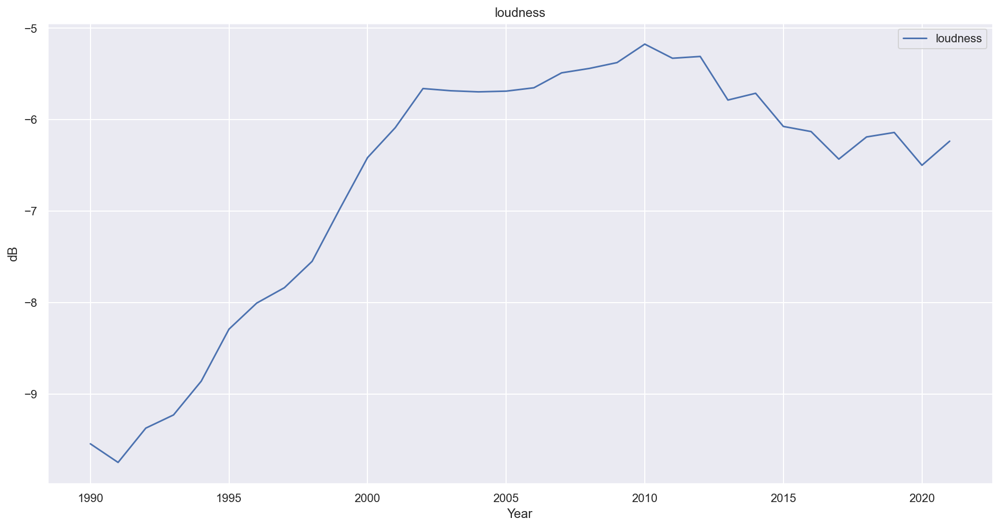

In [67]:
plt.figure(figsize = (16,8))
sb.set(style="darkgrid")
x=decadeHits.groupby('year')['loudness'].mean()
ax=sb.lineplot(x=x.index,y=x,label='loudness')
ax.set_title('loudness')
ax.set_ylabel('dB')
ax.set_xlabel('Year')

## Acousticness of songs over the years
A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.

Text(0.5, 0, 'Year')

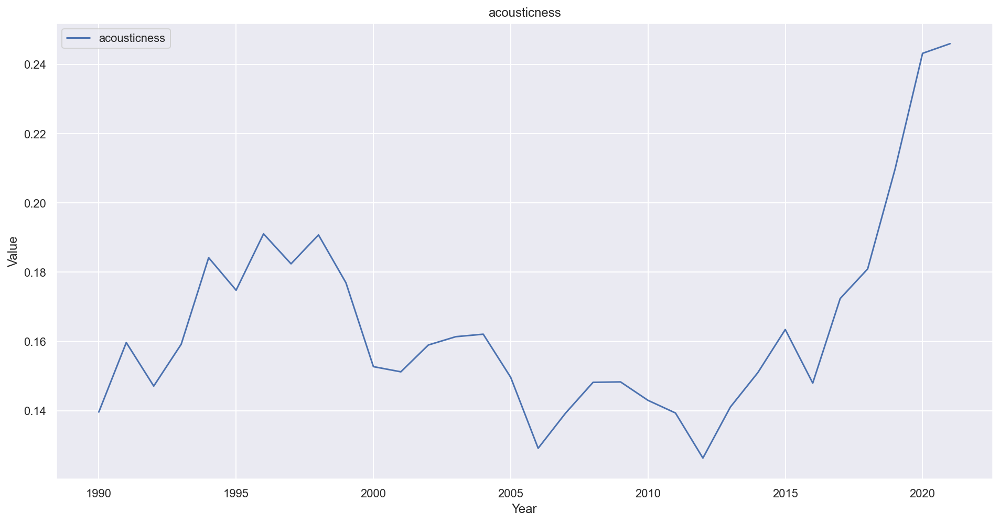

In [68]:
plt.figure(figsize = (16,8))
sb.set(style="darkgrid")
x=decadeHits.groupby('year')['acousticness'].mean()
ax=sb.lineplot(x=x.index,y=x,label='acousticness')
ax.set_title('acousticness')
ax.set_ylabel('Value')
ax.set_xlabel('Year')

## Speechiness of songs over the years

The measure of spoken words in a track. The more speech there is in a track, the closer to 1.0 the attribute value. Values above 0.66 are typically entirely spoken word. Tracks with values above between 0.33 and 0.66 may contain both music and speech, such as rap music. Tracks with values below 0.33 most likely are just music.

Text(0.5, 0, 'Year')

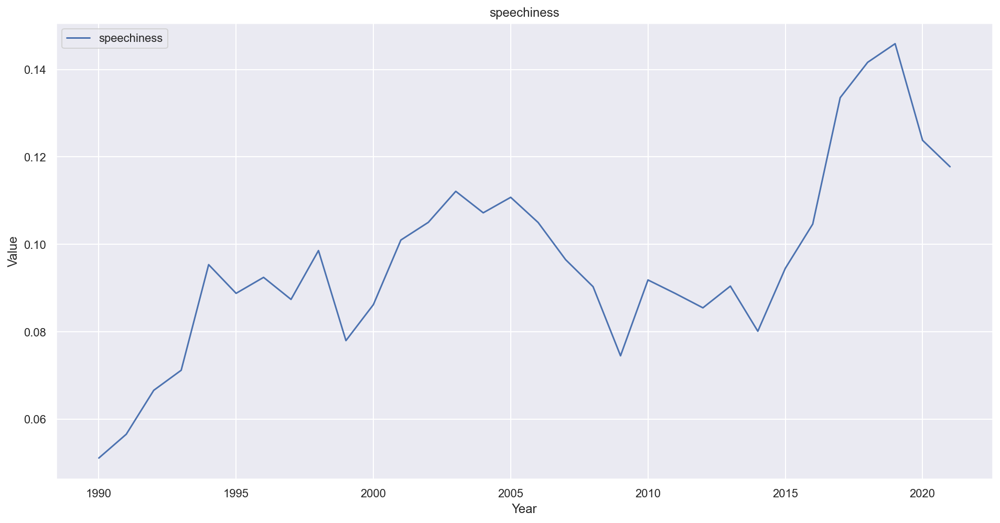

In [69]:
plt.figure(figsize = (16,8))
sb.set(style="darkgrid")
x=decadeHits.groupby('year')['speechiness'].mean()
ax=sb.lineplot(x=x.index,y=x,label='speechiness')
ax.set_title('speechiness')
ax.set_ylabel('Value')
ax.set_xlabel('Year')

## Liveness of songs over the years
Detects the presence of an audience in the track, including clapping, cheering and encores. Higher values most likely represent tracks that were performed live.

Text(0.5, 0, 'Year')

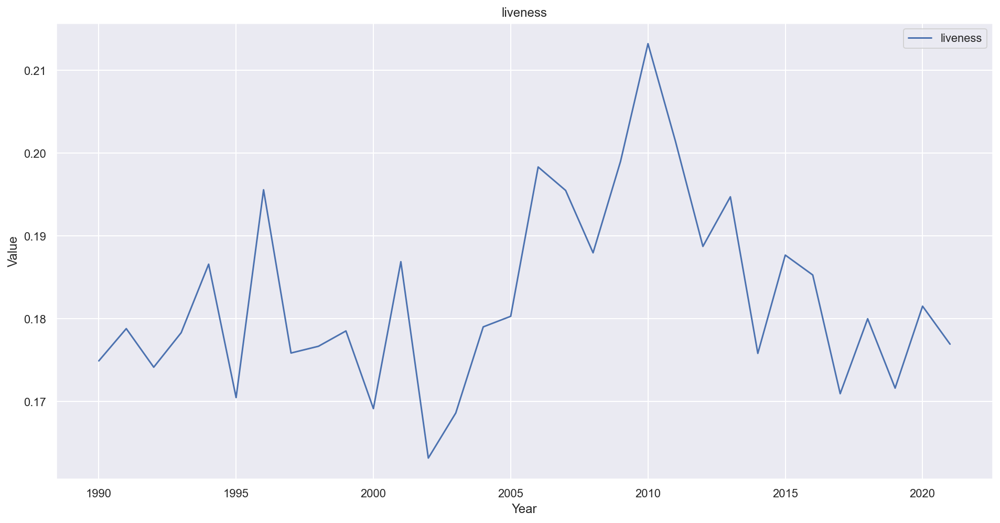

In [70]:
plt.figure(figsize = (16,8))
sb.set(style="darkgrid")
x=decadeHits.groupby('year')['liveness'].mean()
ax=sb.lineplot(x=x.index,y=x,label='liveness')
ax.set_title('liveness')
ax.set_ylabel('Value')
ax.set_xlabel('Year')

## Valence of songs over the years
A measure of how 'negative' a song sounds, lower values typically represent sad, angry or depressed sound, while higher values represent happy, cheerful or euphoric sounds.

Text(0.5, 0, 'Year')

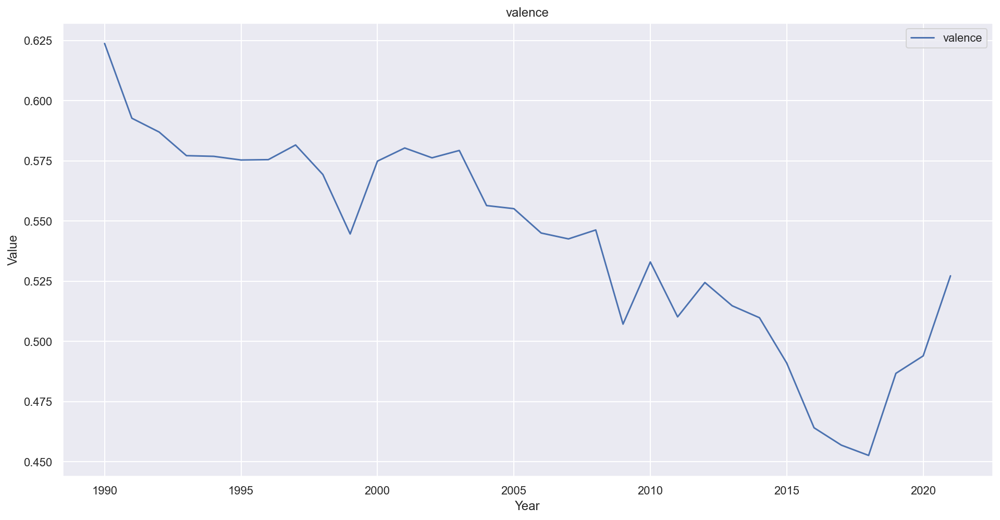

In [71]:
plt.figure(figsize = (16,8))
sb.set(style="darkgrid")
x=decadeHits.groupby('year')['valence'].mean()
ax=sb.lineplot(x=x.index,y=x,label='valence')
ax.set_title('valence')
ax.set_ylabel('Value')
ax.set_xlabel('Year')

## Correlation matrices for all 3 decades

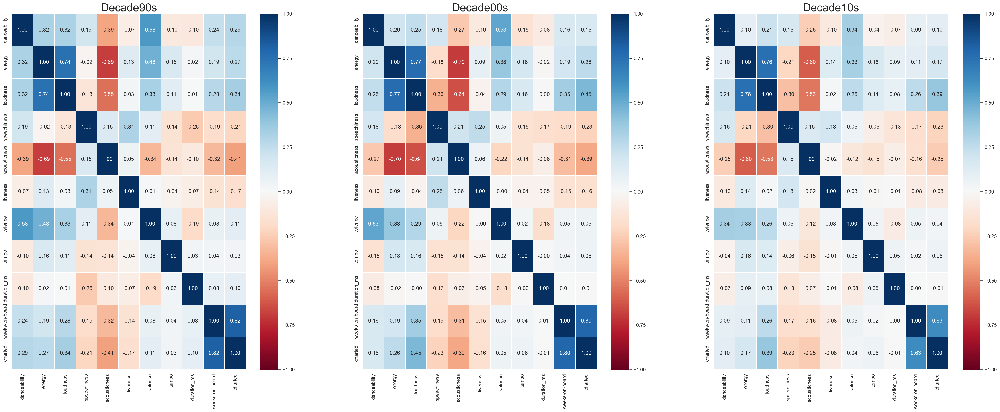

In [62]:
#dropping certain features for each decade
decade90_final = decade90.drop(labels = ['track', 'artist', 'year'], axis = 1, inplace = False)
decade00_final = decade00.drop(labels = ['track', 'artist', 'year'], axis = 1, inplace = False)
decade10_final = decade10.drop(labels = ['track', 'artist', 'year'], axis = 1, inplace = False)

# Creating 3 Subplots
f = plt.figure(figsize=(40, 50))
ax1 = f.add_subplot(3, 3, 1) # row, column, position
ax2 = f.add_subplot(3, 3, 2)
ax3 = f.add_subplot(3, 3, 3)

#Creating Heatmaps for every decade
sb.heatmap(decade90_final.corr(), ax = ax1 ,vmin = -1, vmax = 1, linewidths = 1, annot = True, fmt = ".2f", annot_kws = {"size": 12}, cmap = "RdBu")
ax1.set_title("Decade90s", fontsize= 25)
sb.heatmap(decade00_final.corr(), ax = ax2, vmin = -1, vmax = 1, linewidths = 1, annot = True, fmt = ".2f", annot_kws = {"size": 12}, cmap = "RdBu")
ax2.set_title("Decade00s", fontsize= 25)
sb.heatmap(decade10_final.corr(), ax = ax3, vmin = -1, vmax = 1, linewidths = 1, annot = True, fmt = ".2f", annot_kws = {"size": 12}, cmap = "RdBu")
ax3.set_title("Decade10s", fontsize= 25)

plt.show()

## Visualising outliers for each decade

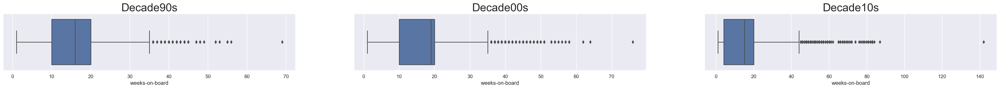

In [73]:
# Creating 3 Subplots
f = plt.figure(figsize=(40, 8))
ax1 = f.add_subplot(3, 3, 1) # row, column, position
ax2 = f.add_subplot(3, 3, 2)
ax3 = f.add_subplot(3, 3, 3)

#Creating Heatmaps for every decade
sb.boxplot(x = decade90hit['weeks-on-board'], ax = ax1)
ax1.set_title("Decade90s", fontsize= 25)
sb.boxplot(x = decade00hit['weeks-on-board'], ax = ax2)
ax2.set_title("Decade00s", fontsize= 25)
sb.boxplot(x = decade10hit['weeks-on-board'], ax = ax3)
ax3.set_title("Decade10s", fontsize= 25)

plt.show()

## Multi-scatter plot for all features
Pretty presentation, but it takes too long to process 19000 data points, and would look too cluttered. So we sampled 2000, and visualised that here.

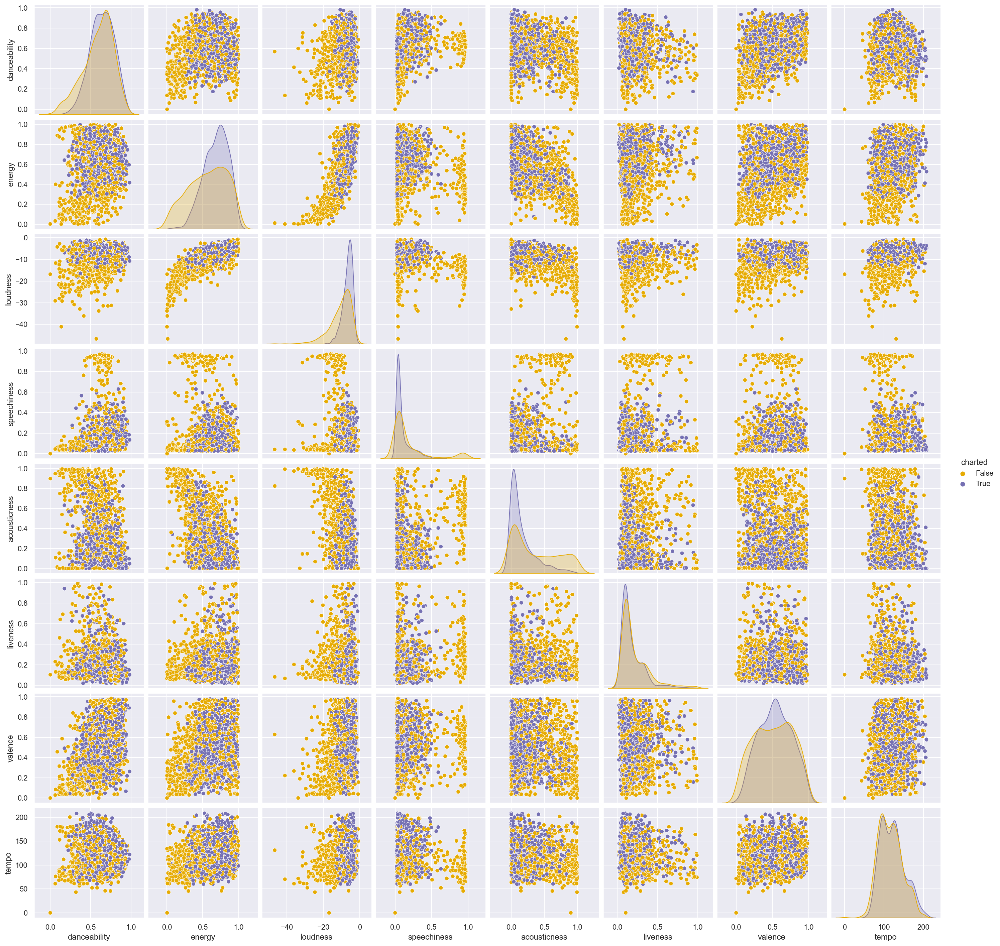

In [74]:
cols = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'liveness', 'valence', 'tempo', 'charted']
sampledecade = final.sample(n = 2000, random_state = 52)
sb.pairplot(data = sampledecade[cols], hue = 'charted', palette = 'Dark2_r')

<hr><font color="green"><h1>from file: spotify_machine_learning</h1></font>

# Machine Learning for Spotify datasets

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np
import plotly.graph_objects as go
from pprint import pprint
from time import perf_counter
from sklearn.tree import plot_tree

%config InlineBackend.figure_format = 'retina' # Higher quality images for slides

In [2]:
train90 = pd.read_csv('output/train/train90.csv')
train00 = pd.read_csv('output/train/train00.csv')
train10 = pd.read_csv('output/train/train10.csv')

test90 = pd.read_csv('output/test/test90.csv')
test00 = pd.read_csv('output/test/test00.csv')
test10 = pd.read_csv('output/test/test10.csv')

In [3]:
# creating train and test sets for each year
# weeks-on-board -> Numerical
# charted -> Categorical

x_train90 = train90.drop(labels = ['track', 'artist', 'year', 'weeks-on-board', 'charted', 'key'], axis = 1)
y_train90 = train90[['charted']].values.ravel()
y_train90lin = train90[['weeks-on-board']].values.ravel()

x_test90 = test90.drop(labels = ['track', 'artist', 'year', 'weeks-on-board', 'charted', 'key'], axis = 1)
y_test90 = test90[['charted']].values.ravel()
y_test90lin = test90[['weeks-on-board']].values.ravel()

x_train00 = train00.drop(labels = ['track', 'artist', 'year', 'weeks-on-board', 'charted', 'key'], axis = 1)
y_train00 = train00[['charted']].values.ravel()
y_train00lin = train00[['weeks-on-board']].values.ravel()

x_test00 = test00.drop(labels = ['track', 'artist', 'year', 'weeks-on-board', 'charted', 'key'], axis = 1)
y_test00 = test00[['charted']].values.ravel()
y_test00lin = test00[['weeks-on-board']].values.ravel()

x_train10 = train10.drop(labels = ['track', 'artist', 'year', 'weeks-on-board', 'charted', 'key'], axis = 1)
y_train10 = train10[['charted']].values.ravel()
y_train10lin = train10[['weeks-on-board']].values.ravel()

x_test10 = test10.drop(labels = ['track', 'artist', 'year', 'weeks-on-board', 'charted', 'key'], axis = 1)
y_test10 = test10[['charted']].values.ravel()
y_test10lin = test10[['weeks-on-board']].values.ravel()

## Metric selection
We went through many options for metrics to be used over machine learning. In the end, we considered over accuracy, precision & recall, f1 score and area-under-the-curve. We ruled out accuracy, as it was a little too simple for our problem. We also decided that f1 score was better over precision and recall, as the f1 score balanced the pros and cons of the 2 metrics. We decided not to go with AUC as it was slightly overkill for us.

In [4]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
from sklearn.inspection import permutation_importance

# Selected metric
metric_score = f1_score
metrics = [accuracy_score, precision_score, recall_score, f1_score, roc_auc_score]

# Calculate scores across all chosen metrics
def metricscores(predicts):
    tests = [y_test90, y_test00, y_test10]
    scores = pd.DataFrame(columns = ['decade', 'accuracy_score', 'precision_score', 'recall_score', 'f1_score', 'roc_auc_score'])
    for name, decade, predict in zip(['Decade 90', 'Decade 00', 'Decade 10'], predicts, tests):
        row = [name]
        for metric in metrics:
            row.append(metric(decade, predict))
        scores.loc[len(scores)] = row
        
    temp = ["Standard Deviation"]
    for column in scores.columns[1:]:
        temp.append(np.std(scores[column]))


    scores.loc[len(scores)] = temp
    return scores

## Linear regression

Our first point of data was weeks-on-board, so we started off with linear regression.

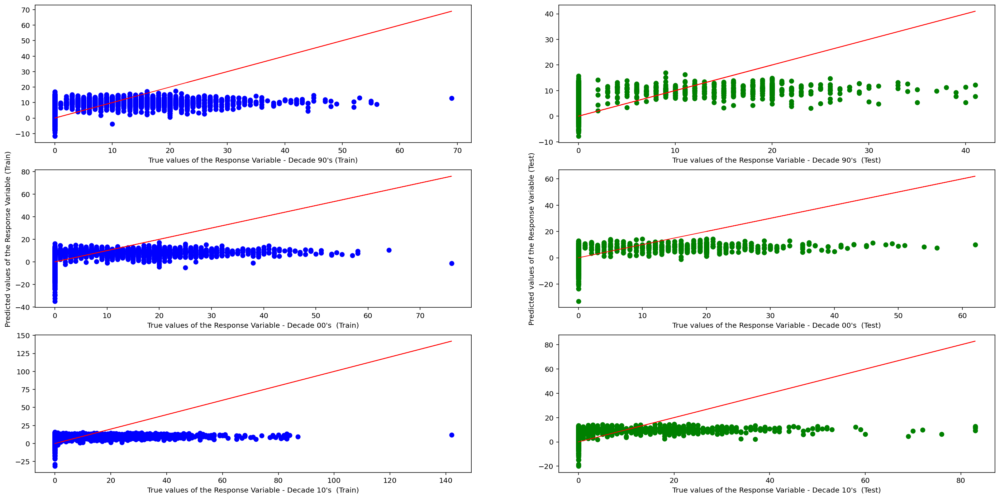

In [5]:
from sklearn.linear_model import LinearRegression

linreg90 = LinearRegression()
linreg00 = LinearRegression()
linreg10 = LinearRegression()

linreg90.fit(x_train90, y_train90lin)
linreg00.fit(x_train00, y_train00lin)
linreg10.fit(x_train10, y_train10lin)

linreg90.predict(x_test90)
linreg00.predict(x_test00)
linreg10.predict(x_test10)

# Predict SalePrice values corresponding to Predictors
y_train_pred90 = linreg90.predict(x_train90)
y_test_pred90 = linreg90.predict(x_test90)
y_train_pred00 = linreg10.predict(x_train00)
y_test_pred00 = linreg10.predict(x_test00)
y_train_pred10 = linreg10.predict(x_train10)
y_test_pred10 = linreg10.predict(x_test10)

# Plot the Predictions vs the True values
f, axes = plt.subplots(3, 2, figsize=(24, 12))
axes[0,0].scatter(y_train90lin, y_train_pred90, color = "blue")
axes[0,0].plot(y_train90lin, y_train90lin, 'r-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable - Decade 90's (Train)")
axes[0,1].scatter(y_test90lin, y_test_pred90, color = "green")
axes[0,1].plot(y_test90lin, y_test90lin, 'r-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable - Decade 90's  (Test)")


axes[1,0].scatter(y_train00lin, y_train_pred00, color = "blue")
axes[1,0].plot(y_train00lin, y_train00lin, 'r-', linewidth = 1)
axes[1,0].set_xlabel("True values of the Response Variable - Decade 00's  (Train)")
axes[1,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1,1].scatter(y_test00lin, y_test_pred00, color = "green")
axes[1,1].plot(y_test00lin, y_test00lin, 'r-', linewidth = 1)
axes[1,1].set_xlabel("True values of the Response Variable - Decade 00's  (Test)")
axes[1,1].set_ylabel("Predicted values of the Response Variable (Test)")


axes[2,0].scatter(y_train10lin, y_train_pred10, color = "blue")
axes[2,0].plot(y_train10lin, y_train10lin, 'r-', linewidth = 1)
axes[2,0].set_xlabel("True values of the Response Variable - Decade 10's  (Train)")
axes[2,1].scatter(y_test10lin, y_test_pred10, color = "green")
axes[2,1].plot(y_test10lin, y_test10lin, 'r-', linewidth = 1)
axes[2,1].set_xlabel("True values of the Response Variable - Decade 10's  (Test)")
plt.show()

In [6]:
from sklearn.metrics import mean_squared_error

linreg_score90 = linreg90.score(x_train90, y_train90lin)
linreg_score00 = linreg00.score(x_train00, y_train00lin)
linreg_score10 = linreg10.score(x_train10, y_train10lin)


print("Linear Regression score (90s): \t:", linreg_score90)
print("Mean Squared Error on train set (MSE) \t:", mean_squared_error(y_train90lin, y_train_pred90))
print("Mean Squared Error on test set(MSE) \t:", mean_squared_error(y_test90lin, y_test_pred90))
print()

print("Linear Regression score (00s): \t:", linreg_score00)
print("Mean Squared Error on train set (MSE) \t:", mean_squared_error(y_train00lin, y_train_pred00))
print("Mean Squared Error on test set(MSE) \t:", mean_squared_error(y_test00lin, y_test_pred00))
print()

print("Linear Regression score (10s): \t:", linreg_score10)
print("Mean Squared Error on train set (MSE) \t:", mean_squared_error(y_train10lin, y_train_pred10))
print("Mean Squared Error on test set(MSE) \t:", mean_squared_error(y_test10lin, y_test_pred10))

Linear Regression score (90s): 	: 0.1854943854920693
Mean Squared Error on train set (MSE) 	: 78.12696761888752
Mean Squared Error on test set(MSE) 	: 72.69656868548766

Linear Regression score (00s): 	: 0.18312419114463485
Mean Squared Error on train set (MSE) 	: 108.68562260096554
Mean Squared Error on test set(MSE) 	: 119.08715564382629

Linear Regression score (10s): 	: 0.105009265941709
Mean Squared Error on train set (MSE) 	: 140.32572745546847
Mean Squared Error on test set(MSE) 	: 130.69239797992284


Linear regression didn't seem to be working too well. It was at this point that we made the charted feature on the dataset, and moved on to classification.

## Logistic Regression

Our simplest form of classification, basically a sanity check for us before we move on to other models.

In [7]:
from sklearn.linear_model import LogisticRegression


THRESHOLD = 0.5

clf90 = LogisticRegression(class_weight="balanced")
clf90.fit(x_train90, y_train90)

log_preds90 = np.where(clf90.predict_proba(x_test90)[:,1] > THRESHOLD, 1, 0)

clf00 = LogisticRegression(class_weight="balanced")
clf00.fit(x_train00, y_train00)

log_preds00 = np.where(clf00.predict_proba(x_test00)[:,1] > THRESHOLD, 1, 0)

clf10 = LogisticRegression(class_weight="balanced")
clf10.fit(x_train10, y_train10)

log_preds10 = np.where(clf90.predict_proba(x_test10)[:,1] > THRESHOLD, 1, 0)

log_model_score90 = metric_score(y_test90, log_preds90)
log_model_score00 = metric_score(y_test00, log_preds00)
log_model_score10 = metric_score(y_test10, log_preds10)

Text(0.5, 1.0, 'Decade 10s')

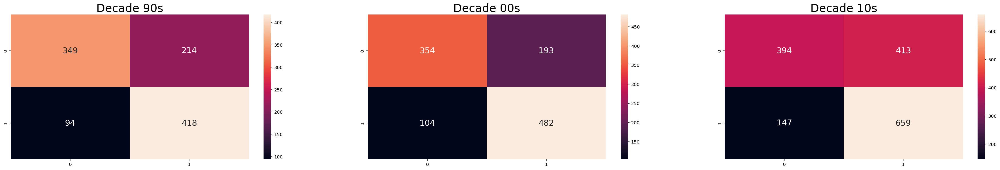

In [8]:
f = plt.figure(figsize=(40, 20))
ax1 = f.add_subplot(3, 3, 1) # row, column, position
ax2 = f.add_subplot(3, 3, 2)
ax3 = f.add_subplot(3, 3, 3)

sb.heatmap(confusion_matrix(y_test90, log_preds90), ax=ax1, annot = True, fmt=".0f", annot_kws={"size": 18})
ax1.set_title("Decade 90s", fontsize= 25)
sb.heatmap(confusion_matrix(y_test00, log_preds00), ax=ax2, annot = True, fmt=".0f", annot_kws={"size": 18})
ax2.set_title("Decade 00s", fontsize= 25)
sb.heatmap(confusion_matrix(y_test10, log_preds10), ax=ax3, annot = True, fmt=".0f", annot_kws={"size": 18})
ax3.set_title("Decade 10s", fontsize= 25)

In [9]:
log_scores = metricscores([log_preds90, log_preds00, log_preds10])

display(log_scores)

,decade,accuracy_score,precision_score,recall_score,f1_score,roc_auc_score
0,Decade 90,0.713488,0.816406,0.661392,0.730769,0.724601
1,Decade 00,0.737864,0.822526,0.714074,0.764473,0.743500
2,Decade 10,0.652821,0.817618,0.614739,0.701810,0.671510
3,Standard Deviation,0.035757,0.002646,0.040578,0.025606,0.030475


## Decision Tree Classifier

One of our simplest methods of classification, also part of our sanity check.

In [10]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
classifier = "Decision Tree"


# Decision Tree using Train Data
dectree90 = DecisionTreeClassifier(max_depth = 6)
dectree00 = DecisionTreeClassifier(max_depth = 6) 
dectree10 = DecisionTreeClassifier(max_depth = 6) 


dectree90.fit(x_train90, y_train90)
dectree00.fit(x_train00, y_train00)   
dectree10.fit(x_train10, y_train10)                  

# Predict Response corresponding to Predictors
dectree_pred90 = dectree90.predict(x_test90)
dectree_pred00 = dectree00.predict(x_test00)
dectree_pred10 = dectree10.predict(x_test10)

dec_test_score90 = metric_score(y_test90, dectree_pred90)
dec_test_score00 = metric_score(y_test00, dectree_pred00)
dec_test_score10 = metric_score(y_test10, dectree_pred10)

print(f"F1 Score for {classifier} on Decade 90 : {dec_test_score90}")
print(f"F1 Score for {classifier} on Decade 00 : {dec_test_score00}")
print(f"F1 Score for {classifier} on Decade 10 : {dec_test_score10}")

F1 Score for Decision Tree on Decade 90 : 0.7316666666666667
F1 Score for Decision Tree on Decade 00 : 0.7720090293453724
F1 Score for Decision Tree on Decade 10 : 0.7347649448636101


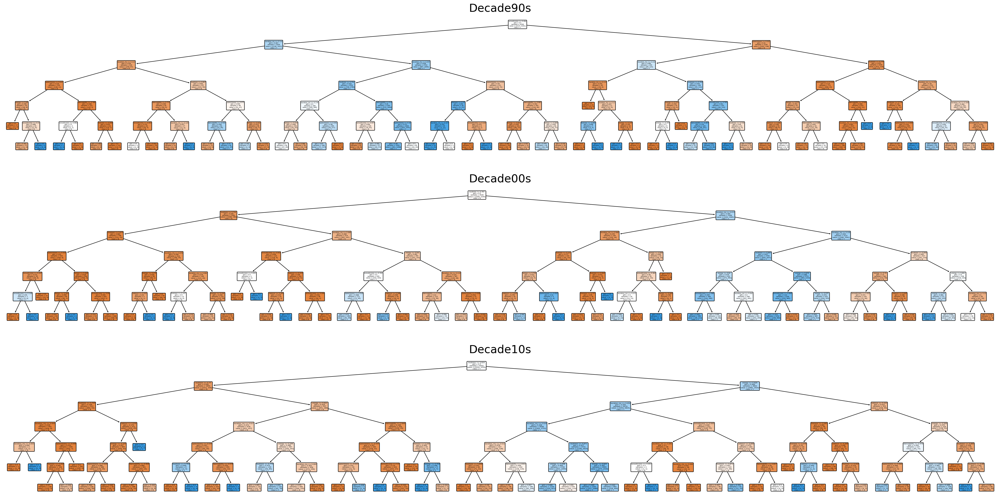

<Figure size 1080x720 with 0 Axes>

In [11]:
f = plt.figure(figsize=(40, 20))
ax1 = f.add_subplot(3, 1, 1) # row, column, position
ax2 = f.add_subplot(3, 1, 2)
ax3 = f.add_subplot(3, 1, 3)

fig = plt.figure(figsize=(15, 10))
plot_tree(dectree90, ax= ax1,
          feature_names=x_train90.columns,
          class_names=["N", "Y"], 
          filled=True, impurity=True, 
          rounded=True)

ax1.set_title("Decade90s", fontsize= 25)

plot_tree(dectree00, ax= ax2,
          feature_names=x_train00.columns,
          class_names=["N", "Y"], 
          filled=True, impurity=True, 
          rounded=True)

ax2.set_title("Decade00s", fontsize= 25)

plot_tree(dectree10, ax= ax3,
          feature_names=x_train10.columns,
          class_names=["N", "Y"], 
          filled=True, impurity=True, 
          rounded=True)

ax3.set_title("Decade10s", fontsize= 25)
plt.show()

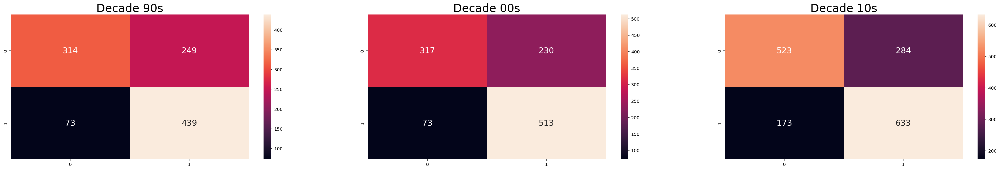

In [12]:
f = plt.figure(figsize=(40, 20))
ax1 = f.add_subplot(3, 3, 1) # row, column, position
ax2 = f.add_subplot(3, 3, 2)
ax3 = f.add_subplot(3, 3, 3)

sb.heatmap(confusion_matrix(y_test90, dectree_pred90), ax=ax1, annot = True, fmt=".0f", annot_kws={"size": 18})
ax1.set_title("Decade 90s", fontsize = 25)
sb.heatmap(confusion_matrix(y_test00, dectree_pred00), ax=ax2, annot = True, fmt=".0f", annot_kws={"size": 18})
ax2.set_title("Decade 00s", fontsize = 25)
sb.heatmap(confusion_matrix(y_test10, dectree_pred10), ax=ax3, annot = True, fmt=".0f", annot_kws={"size": 18})
ax3.set_title("Decade 10s", fontsize = 25)
plt.show()

## Random Forest

Reference: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

Using the Random Forest module to perform both regression on weeks-on-board, and classification on charted.

### Basic Random Forest Classifier

In [13]:
from sklearn.ensemble import RandomForestClassifier
classifier = "Random Forest"

RF90 = RandomForestClassifier(n_estimators = 100, 
                                max_depth = 6,
                                max_features = 'auto', 
                                min_samples_leaf = 60,
                                oob_score = False,
                                bootstrap = True, 
                                n_jobs = -1, 
                                random_state = 52)
RF00 = RandomForestClassifier(n_estimators = 100, 
                                max_depth = 6,
                                max_features = 'auto', 
                                min_samples_leaf = 60,
                                oob_score = False,
                                bootstrap = True, 
                                n_jobs = -1, 
                                random_state = 52)
RF10 = RandomForestClassifier(n_estimators = 100, 
                                max_depth = 6,
                                max_features = 'auto', 
                                min_samples_leaf = 60,
                                oob_score = False,
                                bootstrap = True, 
                                n_jobs = -1, 
                                random_state = 52)

RF90.fit(x_train90, y_train90)
RF00.fit(x_train00, y_train00)
RF10.fit(x_train10, y_train10)

rf_pred90 = RF90.predict(x_test90)
rf_pred00 = RF00.predict(x_test00)
rf_pred10 = RF10.predict(x_test10)

rf_score90 = metric_score(y_test90, rf_pred90)
rf_score00 = metric_score(y_test00, rf_pred00)
rf_score10 = metric_score(y_test10, rf_pred10)


print(f"F1 Score for {classifier} on Decade 90 : {rf_score90}")
print(f"F1 Score for {classifier} on Decade 00 : {rf_score00}")
print(f"F1 Score for {classifier} on Decade 10 : {rf_score10}")

F1 Score for Random Forest on Decade 90 : 0.740225890529974
F1 Score for Random Forest on Decade 00 : 0.7811023622047245
F1 Score for Random Forest on Decade 10 : 0.7495760316563029


### Grid Search Cross Validation for Regression

Trying out the Random Forest Regressor for weeks-on-board

Setting random grid and search grid to be used in cross validation searches

Reference: https://www.analyticsvidhya.com/blog/2015/06/tuning-random-forest-model/

and https://towardsdatascience.com/random-forest-regression-5f605132d19d

In [14]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {
    'n_estimators': n_estimators,
    'max_features': max_features,
    'max_depth': max_depth,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf,
    'bootstrap': bootstrap
}

search_grid = { 
    'n_estimators': n_estimators,
    'max_features': max_features,
    'max_depth' : max_depth
}

pprint(random_grid)
pprint(search_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt', 'log2'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}
{'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt', 'log2'],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [15]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
classifier = "Random Forest Regressor"

def rfgs(x_train, x_test, y_trainlin, y_testlin):
    start = perf_counter()

    rf_search = GridSearchCV(estimator = RandomForestRegressor(random_state = 52), 
                            param_grid = search_grid, 
                            cv = 3)

    rf_search.fit(x_train, y_trainlin)
    end = perf_counter()
    
    display(rf_search.best_params_)
    print(f"Time elapsed : {int(end-start)//60}:{int(end-start)%60}")
    
    best_search = rf_search.best_estimator_
    rf_preds = best_search.predict(x_test)
    rf_scores = best_search.score(x_train, y_trainlin)
    
    
    
    return best_search, rf_preds, rf_scores

RF90s, rf_pred90s, rf_score90s = rfgs(x_train90, x_test90, y_train90lin, y_test90lin)
RF00s, rf_pred00s, rf_score00s = rfgs(x_train00, x_test00, y_train00lin, y_test00lin)
RF10s, rf_pred10s, rf_score10s = rfgs(x_train10, x_test10, y_train10lin, y_test10lin)


print(f"Accuracy for {classifier} on Decade 90 : {rf_score90s}")
print(f"Accuracy for {classifier} on Decade 00 : {rf_score00s}")
print(f"Accuracy for {classifier} on Decade 10 : {rf_score10s}")

KeyboardInterrupt: 

### Randomized Search Cross Validation for Classification
Fitting 3 folds for each of 100 candidates, totalling 300 fits for each decade

Reference: https://github.com/WillKoehrsen/Machine-Learning-Projects/blob/master/random_forest_explained/Improving%20Random%20Forest%20Part%202.ipynb

In [ ]:
# Use the random grid to search for best hyperparameters
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores

classifier = "Cross Validated Random Forest"

def rfcv(x_train, x_test, y_train, y_test):
    RF = RandomForestClassifier(random_state = 52)
    
    start = perf_counter()
    rf_random = RandomizedSearchCV(estimator = RF, 
                                   param_distributions = random_grid, 
                                   n_iter = 100, 
                                   scoring = 'f1', 
                                   cv = 3, 
                                   verbose = 2, 
                                   random_state = 52, 
                                   n_jobs = -1,
                                   error_score = 'raise',
                                   return_train_score = True)

    # Fit the random search model
    rf_random.fit(x_train, y_train);
    end = perf_counter()
    
    display(rf_random.best_params_)
    print(f"Time elapsed : {int(end-start)//60}:{int(end-start)%60}")
    
    best_random = rf_random.best_estimator_
    rf_predx = best_random.predict(x_test)
    rf_scorex = metric_score(y_test, rf_predx)
    
    return best_random, rf_predx, rf_scorex

RF90x, rf_pred90x, rf_score90x = rfcv(x_train90, x_test90, y_train90, y_test90)
RF00x, rf_pred00x, rf_score00x = rfcv(x_train00, x_test00, y_train00, y_test00)
RF10x, rf_pred10x, rf_score10x = rfcv(x_train10, x_test10, y_train10, y_test10)

print(f"F1 Score for {classifier} on Decade 90 : {rf_score90x}")
print(f"F1 Score for {classifier} on Decade 00 : {rf_score00x}")
print(f"F1 Score for {classifier} on Decade 10 : {rf_score10x}")

In [ ]:
rf_scores = metricscores([rf_pred90x, rf_pred00x, rf_pred10x])
display(rf_scores)

### Feature importance for random forest

In [ ]:
fig, axs = plt.subplots(nrows = 1, ncols = 3, figsize=(26, 8), sharex = True)
fig.suptitle('Feature Importances across decades')
axs[0].barh(RF90.feature_names_in_, RF90x.feature_importances_, height = 1)
axs[0].set_title("Decade90")
axs[1].barh(RF00.feature_names_in_, RF00x.feature_importances_, height = 1)
axs[1].set_title("Decade00")
axs[2].barh(RF10.feature_names_in_, RF10x.feature_importances_, height = 1)
axs[2].set_title("Decade10")

plt.show()

### Plot tree to visualise random forest

In [ ]:
f = plt.figure(figsize=(30, 20))
ax1 = f.add_subplot(3, 1, 1) # row, column, position
ax2 = f.add_subplot(3, 1, 2)
ax3 = f.add_subplot(3, 1, 3)

fig = plt.figure(figsize=(15, 3))
plot_tree(RF90x.estimators_[50], ax= ax1,
          feature_names=x_train90.columns,
          class_names=["N", "Y"], 
          filled=True, impurity=True, 
          rounded=True)

ax1.set_title("Decade90s", fontsize= 25)

plot_tree(RF00x.estimators_[50], ax= ax2,
          feature_names=x_train00.columns,
          class_names=["N", "Y"], 
          filled=True, impurity=True, 
          rounded=True)

ax2.set_title("Decade00s", fontsize= 25)

plot_tree(RF10x.estimators_[50], ax= ax3,
          feature_names=x_train10.columns,
          class_names=["N", "Y"], 
          filled=True, impurity=True, 
          rounded=True)

ax3.set_title("Decade10s", fontsize= 25)
plt.show()

## K-Nearest Neighbors

Reference: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html#sklearn.neighbors.KNeighborsClassifier

Using K-Neighbors Classifier to work on the dataset. We ran 3 different for loops to find the optimal value for k for each decade, all while using the cross_val_score for verification.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
# from mlxtend.plotting import plot_decision_regions
from sklearn.model_selection import cross_val_score
import seaborn as sns

# creating list of K for KNN
k_list90 = k_list00 = k_list10 = list(range(1,100,2))
# creating list of cv scores
cv_scores90 = []
cv_scores00 = []
cv_scores10 = []

# perform 10-fold cross validation
for k in k_list90:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, x_train90, y_train90, cv=3, scoring='f1')
    cv_scores90.append(scores.mean())

for k in k_list00:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, x_train00, y_train00, cv=3, scoring='f1')
    cv_scores00.append(scores.mean())

for k in k_list10:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, x_train10, y_train10, cv=3, scoring='f1')
    cv_scores10.append(scores.mean())

# changing to misclassification error
MSE90 = [1 - x for x in cv_scores90]
MSE00 = [1 - x for x in cv_scores00]
MSE10 = [1 - x for x in cv_scores10]

plt.figure()
plt.figure(figsize=(15,10))
plt.title('Optimal number of neighbors', fontsize=20, fontweight='bold')
plt.xlabel('Number of Neighbors K', fontsize=15)
plt.ylabel('Misclassification Error', fontsize=15)
sns.set_style("whitegrid")
plt.plot(k_list90, MSE90, label = 'Decade 90')
plt.plot(k_list00, MSE00, label = 'Decade 00')
plt.plot(k_list10, MSE10, label = 'Decade 10')

plt.show()

### Finding the number of neighbors and score for each decade

In [ ]:
classifier = "K-Neighbors"
def findmin(MSE): 
    min = 999
    minidx = 0
    for index, mse in enumerate(MSE):
        if mse < min:
            min = mse
            minidx = index
    return minidx

print(f"K-Neighbors for Decade90: {k_list90[findmin(MSE90)]}")
print(f"F1 Score for {classifier} on Decade 90 : {max(cv_scores90)}")
print(f"K-Neighbors for Decade00: {k_list00[findmin(MSE00)]}")
print(f"F1 Score for {classifier} on Decade 00 : {max(cv_scores00)}")
print(f"K-Neighbors for Decade10: {k_list10[findmin(MSE10)]}")
print(f"F1 Score for {classifier} on Decade 10 : {max(cv_scores10)}")

## Support Vector Classifier (SVM)

In [ ]:
from sklearn.svm import SVC
classifier = "SVM"

svm_model90 = SVC()
svm_model00 = SVC()
svm_model10 = SVC()

svm_model90.fit(x_train90, y_train90)
svm_model00.fit(x_train00, y_train00)
svm_model10.fit(x_train10, y_train10)

svm_predict90 = svm_model90.predict(x_test90)
svm_predict00 = svm_model00.predict(x_test00)
svm_predict10 = svm_model10.predict(x_test10)

svm_model_score90 = metric_score(y_test90, svm_predict90)
svm_model_score00 = metric_score(y_test00, svm_predict00)
svm_model_score10 = metric_score(y_test10, svm_predict10)

print(f"F1 Score for {classifier} on Decade 90 : {svm_model_score90}")
print(f"F1 Score for {classifier} on Decade 00 : {svm_model_score00}")
print(f"F1 Score for {classifier} on Decade 10 : {svm_model_score10}")

In [ ]:
svm_scores = metricscores([svm_predict90, svm_predict00, svm_predict10])

display(svm_scores)

In [ ]:
f = plt.figure(figsize=(40, 20))
ax1 = f.add_subplot(3, 3, 1) # row, column, position
ax2 = f.add_subplot(3, 3, 2)
ax3 = f.add_subplot(3, 3, 3)

sb.heatmap(confusion_matrix(y_test90, svm_predict90), ax=ax1, annot = True, fmt=".0f", annot_kws={"size": 18})
ax1.set_title("Decade 90s", fontsize = 25)
sb.heatmap(confusion_matrix(y_test00, svm_predict00), ax=ax2, annot = True, fmt=".0f", annot_kws={"size": 18})
ax2.set_title("Decade 00s", fontsize = 25)
sb.heatmap(confusion_matrix(y_test10, svm_predict10), ax=ax3, annot = True, fmt=".0f", annot_kws={"size": 18})
ax3.set_title("Decade 10s", fontsize = 25)
plt.show()

## Gaussian Naive Bayes Classifier

In [ ]:
from sklearn.naive_bayes import GaussianNB
classifier = "GNB"

gnb_model90 = GaussianNB()
gnb_model00 = GaussianNB()
gnb_model10 = GaussianNB()


gnb_model90.fit(x_train90, y_train90)
gnb_model00.fit(x_train00, y_train00)
gnb_model10.fit(x_train10, y_train10)

gnb_predict90 = gnb_model90.predict(x_test90)
gnb_predict00 = gnb_model00.predict(x_test00)
gnb_predict10 = gnb_model10.predict(x_test10)

gnb_model_score90 = metric_score(y_test90, gnb_predict90)
gnb_model_score00 = metric_score(y_test00, gnb_predict00)
gnb_model_score10 = metric_score(y_test10, gnb_predict10)

print(f"F1 Score for {classifier} on Decade 90 : {gnb_model_score90}")
print(f"F1 Score for {classifier} on Decade 00 : {gnb_model_score00}")
print(f"F1 Score for {classifier} on Decade 10 : {gnb_model_score10}")

In [ ]:
gnb_scores = metricscores([gnb_predict90, gnb_predict00, gnb_predict10])

display(gnb_scores)

In [ ]:
f = plt.figure(figsize=(40, 20))
ax1 = f.add_subplot(3, 3, 1) # row, column, position
ax2 = f.add_subplot(3, 3, 2)
ax3 = f.add_subplot(3, 3, 3)

sb.heatmap(confusion_matrix(y_test90, gnb_predict90), ax=ax1, annot = True, fmt=".0f", annot_kws={"size": 18})
ax1.set_title("Decade 90s", fontsize = 25)
sb.heatmap(confusion_matrix(y_test00, gnb_predict00), ax=ax2, annot = True, fmt=".0f", annot_kws={"size": 18})
ax2.set_title("Decade 00s", fontsize = 25)
sb.heatmap(confusion_matrix(y_test10, gnb_predict10), ax=ax3, annot = True, fmt=".0f", annot_kws={"size": 18})
ax3.set_title("Decade 10s", fontsize = 25)
plt.show()

## Conclusion

In [ ]:
import plotly.graph_objects as go


fig = go.Figure()
fig.add_trace(go.Bar(
    x=["Linear Regression", "Random Forest Regressor", "Random Forest Classifier", "Logistic Regression", "K Nearest Neighbours", "Support Vector Machine", "Gaussian Naive Bayes ", "Decision Tree"],
    y=[linreg_score90, rf_score90s, rf_score90x, log_model_score90,  max(cv_scores90), svm_model_score90, gnb_model_score90, dec_test_score90 ],
    name='Decade90',
    marker_color='indianred',
))
fig.add_trace(go.Bar(
    x=["Linear Regression", "Random Forest Regressor", "Random Forest Classifier", "Logistic Regression", "K Nearest Neighbours", "Support Vector Machine", "Gaussian Naive Bayes " , "Decision Tree"],
    y=[linreg_score00, rf_score00s, rf_score00x, log_model_score00,  max(cv_scores00), svm_model_score00, gnb_model_score00, dec_test_score00],
    name='Decade00',
    marker_color='grey'
))

fig.add_trace(go.Bar(
    x=["Linear Regression", "Random Forest Regressor", "Random Forest Classifier", "Logistic Regression", "K Nearest Neighbours", "Support Vector Machine", "Gaussian Naive Bayes ", "Decision Tree"],
    y=[linreg_score10, rf_score10s, rf_score10x, log_model_score10,  max(cv_scores10), svm_model_score10, gnb_model_score10, dec_test_score10],
    name='Decade10',
    marker_color='blue'
))
fig.update_layout(font=dict(size=12))

fig.show()

In [ ]:
fig.write_image("images/fig1.png", format="png", width=2000, height=500, scale=2)

In [ ]:
names = ["Decade", "Linear Regression", "Random Forest Regressor", "Random Forest Classifier", "Logistic Regression", "K Nearest Neighbours", "Support Vector Machine", "Gaussian Naive Bayes ", "Decision Tree"]
scores90 = ["Decade90", linreg_score90, rf_score90s, rf_score90x, log_model_score90,  max(cv_scores90), svm_model_score90, gnb_model_score90, dec_test_score90]
scores00 = ["Decade00", linreg_score00, rf_score00s, rf_score00x, log_model_score00,  max(cv_scores00), svm_model_score00, gnb_model_score00, dec_test_score00]
scores10 = ["Decade10", linreg_score10, rf_score10s, rf_score10x, log_model_score10,  max(cv_scores10), svm_model_score10, gnb_model_score10, dec_test_score10]

scoresdf = pd.DataFrame([scores90, scores00, scores10], columns = [names])
display(scoresdf)